In [ ]:
# Standard Library
import os
import time

# Data Handling & Utilities
import numpy as np
import pandas as pd

# Machine Learning / Metrics
from sklearn.preprocessing import normalize  # untuk L2-normalisasi
from sklearn.metrics.pairwise import cosine_similarity

# PyTorch & Computer Vision
import torch
from torchvision import models, transforms
from PIL import Image
from tqdm import tqdm

# Visualization
import matplotlib.pyplot as plt
import matplotlib.patches as patches


data_dir = "D:\\Trade-Off_CBIR\\dataset\\Corel-1K"
data_dir_GHIM = "D:\\Trade-Off_CBIR\\dataset\\GHIM-10K"

print("Classes available (Corel-1K):", os.listdir(data_dir))
print("Classes available (GHIM-10K):", os.listdir(data_dir_GHIM))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Classes available (Corel-1K): ['africans', 'beaches', 'buildings', 'buses', 'dinosaurs', 'elephants', 'flowers', 'food', 'horses', 'mountains']
Classes available (GHIM-10K): ['aircraft', 'buildings', 'butterfly', 'cars', 'dragon fly', 'fireworks', 'flowers', 'hen', 'horses', 'insects', 'motorcycles', 'mountains', 'sea shores', 'ships', 'sunset', 'temples', 'trees', 'valleys', 'walls', 'yacht']
Using device: cpu


## Tahap 1: Ekstraksi Fitur

In [18]:
efficientnet_v2 = models.efficientnet_v2_s(weights=models.EfficientNet_V2_S_Weights.DEFAULT).to(device).eval()
resnet50 = models.resnet50(weights=models.ResNet50_Weights.DEFAULT).to(device).eval()
convnext = models.convnext_tiny(weights=models.ConvNeXt_Tiny_Weights.DEFAULT).to(device).eval()

# Transformasi standar untuk semua model (224x224)
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])])

## Tahap 2: Pre-trained Models

In [ ]:

# Ukur inference speed untuk semua model
def measure_inference_speed(model, sample_img, transform, device='cuda', use_features=False):
    """
    model: torch model
    sample_img: PIL Image
    transform: torchvision transforms
    device: 'cuda' atau 'cpu'
    use_features: True jika model ConvNeXt/Vision Transformer, agar ambil embedding
    """
    model.eval()
    img_t = transform(sample_img).unsqueeze(0).to(device)
    torch.cuda.synchronize() if device=='cuda' else None
    start = time.time()
    with torch.no_grad():
        if use_features:
            # ConvNeXt Tiny / ViT bisa menggunakan forward_features
            _ = model.forward_features(img_t)
        else:
            _ = model(img_t)
    torch.cuda.synchronize() if device=='cuda' else None
    end = time.time()
    return end - start

# Ukur embedding metrics: inter-class dan intra-class cosine similarity
def measure_embedding_metrics(features, labels):
    """
    features: np.array, shape = (N, dim)
    labels: list/array panjang N
    """
    start = time.time()
    sims = cosine_similarity(features, features)
    search_time = time.time() - start

    inter_dists = []
    classes = list(set(labels))
    for i, cls_i in enumerate(classes):
        idx_i = [k for k,l in enumerate(labels) if l==cls_i]
        for j, cls_j in enumerate(classes):
            if i >= j:
                continue
            idx_j = [k for k,l in enumerate(labels) if l==cls_j]
            inter_dists.append(np.mean(sims[np.ix_(idx_i, idx_j)]))

    intra_dists = []
    for cls in classes:
        idx = [k for k,l in enumerate(labels) if l==cls]
        intra_dists.append(np.mean(sims[np.ix_(idx, idx)]))

    return search_time, np.mean(inter_dists), np.mean(intra_dists)

In [20]:
# Ekstraksi path & label gambar
img_paths = []
labels = []

for cls in os.listdir(data_dir):
    cls_path = os.path.join(data_dir, cls)
    for f in os.listdir(cls_path):
        img_paths.append(os.path.join(cls_path, f))
        labels.append(cls)

# Ekstraksi fitur semua model
efficientnet_features = []
convnext_features = []
resnet50_features = []

for path in tqdm(img_paths, desc="Extracting CNN Features"):
    img = Image.open(path).convert('RGB')
    img_t = transform(img).unsqueeze(0).to(device) # pyright: ignore[reportAttributeAccessIssue]

    with torch.no_grad():
        # EfficientNet V2
        ef_x = efficientnet_v2.features(img_t)
        ef_x = torch.nn.functional.adaptive_avg_pool2d(ef_x, 1)
        ef_x = torch.flatten(ef_x, 1)
        efficientnet_features.append(ef_x.squeeze().cpu().numpy())

        # ConvNeXt Tiny
        cx_x = convnext.features(img_t)
        cx_x = torch.nn.functional.adaptive_avg_pool2d(cx_x, 1)
        cx_x = torch.flatten(cx_x, 1)
        convnext_features.append(cx_x.squeeze().cpu().numpy())

        # ResNet50
        r50_x = resnet50.conv1(img_t)
        r50_x = resnet50.bn1(r50_x)
        r50_x = resnet50.relu(r50_x)
        r50_x = resnet50.maxpool(r50_x)
        r50_x = resnet50.layer1(r50_x)
        r50_x = resnet50.layer2(r50_x)
        r50_x = resnet50.layer3(r50_x)
        r50_x = resnet50.layer4(r50_x)
        r50_x = resnet50.avgpool(r50_x)
        r50_x = torch.flatten(r50_x, 1)
        resnet50_features.append(r50_x.squeeze().cpu().numpy())

# Convert ke numpy array dan normalisasi L2
efficientnet_features = normalize(np.array(efficientnet_features))
convnext_features = normalize(np.array(convnext_features))
resnet50_features = normalize(np.array(resnet50_features))

Extracting CNN Features: 100%|██████████| 1000/1000 [04:34<00:00,  3.64it/s]


## Tahap 3: Image Retrieval & Similarity Matching

In [21]:
# Fungsi retrieve top-K berdasarkan cosine similarity
def retrieve(query_feat, all_feats, top_k=10):
    sims = cosine_similarity([query_feat], all_feats)[0]  # pyright: ignore[reportArgumentType]
    idxs = np.argsort(sims)[::-1][:top_k]
    return idxs

# Fungsi evaluasi Recall@K & Precision@K per kelas
def evaluate_recall_precision(features, labels, top_k=10):
    """
    features: numpy array, shape = (N, dim_feature)
    labels: list of length N
    top_k: int, jumlah top retrieved images
    """
    classes = sorted(list(set(labels)))
    results = []

    for cls in classes:
        # indeks query untuk kelas tertentu
        idxs_cls = [i for i, l in enumerate(labels) if l == cls]
        R_list, P_list = [], []

        for q in idxs_cls:
            retrieved_idx = retrieve(features[q], features, top_k)
            retrieved_labels = [labels[i] for i in retrieved_idx]

            # Recall = jumlah retrieved benar / total data kelas
            R = retrieved_labels.count(cls) / len(idxs_cls)
            # Precision = jumlah retrieved benar / top_k
            P = retrieved_labels.count(cls) / top_k

            R_list.append(R)
            P_list.append(P)

        results.append([cls, np.mean(R_list), np.mean(P_list)])

    df = pd.DataFrame(results, columns=['Class','R','P'])
    
    # Tambahkan row Mean keseluruhan
    mean_row = {
        'Class': 'Mean',
        'R': df['R'].mean(),
        'P': df['P'].mean()
    }
    df = pd.concat([df, pd.DataFrame([mean_row])], ignore_index=True)
    
    # Format angka 4 desimal
    df['R'] = df['R'].astype(float).map("{:.4f}".format)
    df['P'] = df['P'].astype(float).map("{:.4f}".format)

    return df

# Contoh pemanggilan untuk model terbaru
# features_dict berisi embedding numpy hasil ekstraksi
features_dict = {
    'EfficientNet V2': efficientnet_features,
    'ConvNeXt Tiny': convnext_features,
    'ResNet50': resnet50_features
}

# Evaluasi masing-masing model
df_effnet = evaluate_recall_precision(efficientnet_features, labels)
df_convnext = evaluate_recall_precision(convnext_features, labels)
df_resnet50 = evaluate_recall_precision(resnet50_features, labels)

## Tahap 4: Evaluasi

In [ ]:
# Fungsi ukur inference speed
def measure_inference_speed(model, sample_img, transform, device='cuda'):
    model.eval()
    img_t = transform(sample_img).unsqueeze(0).to(device)
    torch.cuda.synchronize() if device=='cuda' else None
    start = time.time()
    with torch.no_grad():
        # Deteksi ConvNeXt Tiny
        if hasattr(model, 'features'):
            x = model.features(img_t)
            x = torch.nn.functional.adaptive_avg_pool2d(x, 1)
            _ = torch.flatten(x, 1)
        else:
            _ = model(img_t)
    torch.cuda.synchronize() if device=='cuda' else None
    end = time.time()
    return end - start

# Fungsi ukur embedding metrics
def measure_embedding_metrics(features, labels):
    start = time.time()
    sims = cosine_similarity(features, features)
    search_time = time.time() - start
    
    inter_dists = []
    classes = list(set(labels))
    for i, cls_i in enumerate(classes):
        idx_i = [k for k,l in enumerate(labels) if l==cls_i]
        for j, cls_j in enumerate(classes):
            if i >= j:
                continue
            idx_j = [k for k,l in enumerate(labels) if l==cls_j]
            inter_dists.append(np.mean(sims[np.ix_(idx_i, idx_j)]))
    
    intra_dists = []
    for cls in classes:
        idx = [k for k,l in enumerate(labels) if l==cls]
        intra_dists.append(np.mean(sims[np.ix_(idx, idx)]))
    
    return search_time, np.mean(inter_dists), np.mean(intra_dists)

# Ambil sample image
sample_img = Image.open(img_paths[0]).convert('RGB')

ef_time = measure_inference_speed(efficientnet_v2, sample_img, transform, str(device))
cx_time = measure_inference_speed(convnext, sample_img, transform, str(device))
r50_time = measure_inference_speed(resnet50, sample_img, transform, str(device))

ef_search, ef_inter, ef_intra = measure_embedding_metrics(efficientnet_features, labels)
cx_search, cx_inter, cx_intra = measure_embedding_metrics(convnext_features, labels)
r50_search, r50_inter, r50_intra = measure_embedding_metrics(resnet50_features, labels)

# Buat DataFrame hasil metrics
df_metrics = pd.DataFrame({
    'Model': ['EfficientNet V2', 'ConvNeXt Tiny', 'ResNet50'],
    'Inference speed (s/img)': [ef_time, cx_time, r50_time],
    'Embedding search time (s)': [ef_search, cx_search, r50_search],
    'Inter-class dist': [ef_inter, cx_inter, r50_inter],
    'Intra-class dist': [ef_intra, cx_intra, r50_intra]
})

display(df_metrics)

,Model,Inference speed (s/img),Embedding search time (s),Inter-class dist,Intra-class dist
0,EfficientNet V2,0.125128,0.018002,0.032133,0.514489
1,ConvNeXt Tiny,0.072004,0.017000,0.290462,0.637508
2,ResNet50,0.084426,0.032000,0.134897,0.557631


In [23]:
# Evaluasi CBIR / Retrieval menggunakan model CNN terbaru
df_effnet = evaluate_recall_precision(efficientnet_features, labels)
df_convnext = evaluate_recall_precision(convnext_features, labels)
df_resnet50 = evaluate_recall_precision(resnet50_features, labels)

# Membuat tabel per kelas
df_table = pd.DataFrame()
df_table['Class'] = sorted(list(set(labels)))  # daftar kelas unik

df_table['EfficientNet V2 R'] = df_effnet['R'].astype(float)
df_table['EfficientNet V2 P'] = df_effnet['P'].astype(float)

df_table['ConvNeXt Tiny R'] = df_convnext['R'].astype(float)
df_table['ConvNeXt Tiny P'] = df_convnext['P'].astype(float)

df_table['ResNet50 R'] = df_resnet50['R'].astype(float)
df_table['ResNet50 P'] = df_resnet50['P'].astype(float)

# MEAN per kolom
mean_row = {
    'Class': 'Mean',
    'EfficientNet V2 R': df_table['EfficientNet V2 R'].mean(),
    'EfficientNet V2 P': df_table['EfficientNet V2 P'].mean(),
    'ConvNeXt Tiny R': df_table['ConvNeXt Tiny R'].mean(),
    'ConvNeXt Tiny P': df_table['ConvNeXt Tiny P'].mean(),
    'ResNet50 R': df_table['ResNet50 R'].mean(),
    'ResNet50 P': df_table['ResNet50 P'].mean(),
}

df_table = pd.concat([df_table, pd.DataFrame([mean_row])], ignore_index=True)

# Format angka 4 desimal (setelah semua mean dihitung)
for col in df_table.columns[1:]:
    df_table[col] = df_table[col].map("{:.4f}".format)

# Tampilkan tabel
display(df_table)

,Class,EfficientNet V2 R,EfficientNet V2 P,ConvNeXt Tiny R,ConvNeXt Tiny P,ResNet50 R,ResNet50 P
0,africans,0.0878,0.8780,0.0857,0.8570,0.0915,0.9150
1,beaches,0.0967,0.9670,0.0978,0.9780,0.0935,0.9350
2,buildings,0.0956,0.9560,0.0961,0.9610,0.0961,0.9610
3,buses,0.1000,1.0000,0.1000,1.0000,0.1000,1.0000
4,dinosaurs,0.1000,1.0000,0.1000,1.0000,0.1000,1.0000
5,elephants,0.1000,1.0000,0.1000,1.0000,0.1000,1.0000
6,flowers,0.1000,1.0000,0.1000,1.0000,0.1000,1.0000
7,food,0.0991,0.9910,0.0981,0.9810,0.0996,0.9960
8,horses,0.0998,0.9980,0.1000,1.0000,0.1000,1.0000
9,mountains,0.0994,0.9940,0.0986,0.9860,0.0983,0.9830


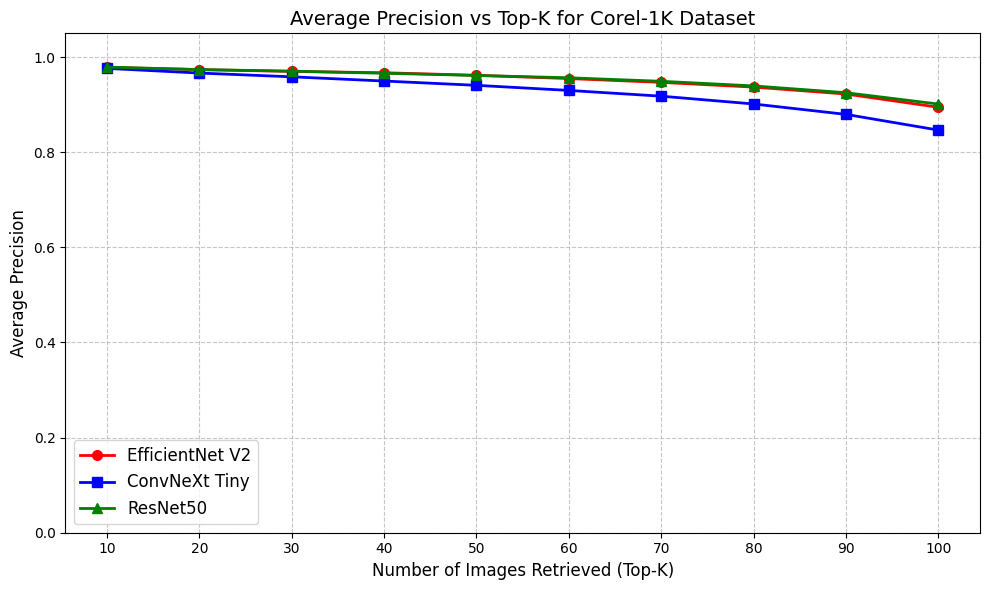

In [24]:
def average_precision_vs_topk(features_list, labels, top_k_max=100):
    top_ks = list(range(10, top_k_max + 1, 10))
    avg_prec = {name: [] for name in features_list}

    # Hitung Average Precision untuk setiap Top-K
    for top_k in top_ks:
        for name, feats in features_list.items():
            df = evaluate_recall_precision(feats, labels, top_k=top_k)
            
            # Pastikan kolom 'P' float
            df['P'] = df['P'].astype(float)
            
            avg_prec[name].append(df['P'].mean())

    plt.figure(figsize=(10, 6))

    # Marker dan warna per model
    markers = {
        'EfficientNet V2': 'o',
        'ConvNeXt Tiny': 's',
        'ResNet50': '^'
    }

    colors = {
        'EfficientNet V2': 'red',
        'ConvNeXt Tiny': 'blue',
        'ResNet50': 'green'
    }

    # Plot Average Precision vs Top-K
    for name in features_list:
        plt.plot(top_ks, avg_prec[name],
                 marker=markers.get(name, 'o'),
                 color=colors.get(name, 'black'),
                 linestyle='-',
                 linewidth=2,
                 markersize=7,
                 label=name)

    plt.xlabel("Number of Images Retrieved (Top-K)", fontsize=12)
    plt.ylabel("Average Precision", fontsize=12)
    plt.title("Average Precision vs Top-K for Corel-1K Dataset", fontsize=14)
    plt.xticks(top_ks)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(fontsize=12)
    plt.ylim(0, 1.05)
    plt.tight_layout()
    plt.show()

# Dictionary fitur terbaru
features_dict = {
    'EfficientNet V2': efficientnet_features,
    'ConvNeXt Tiny': convnext_features,
    'ResNet50': resnet50_features
}

# Jalankan evaluasi dan plot
average_precision_vs_topk(features_dict, labels, top_k_max=100)

In [25]:
def show_topk_cbir(features, labels, img_paths, top_k=4, model_name="Model"):
    classes = sorted(list(set(labels)))

    for cls in classes:
        # ambil 1 query per kelas
        idxs_cls = [i for i, l in enumerate(labels) if l == cls]
        query_idx = idxs_cls[0]  # bisa diubah untuk beberapa query

        # retrieve top-K
        retrieved_idx = retrieve(features[query_idx], features, top_k)

        plt.figure(figsize=(15, 3))
        plt.suptitle(f"{model_name} - Query Class: {cls}", fontsize=14)

        # Query image
        query_img = Image.open(img_paths[query_idx])
        plt.subplot(1, top_k + 1, 1)
        plt.imshow(query_img)
        plt.axis('off')
        plt.title("Query", fontsize=10)
        plt.gca().add_patch(patches.Rectangle((0,0), query_img.width, query_img.height,
                                              edgecolor='blue', fill=False, linewidth=3))

        # Retrieved images
        for i, idx in enumerate(retrieved_idx):
            img = Image.open(img_paths[idx])
            plt.subplot(1, top_k + 1, i + 2)
            plt.imshow(img)
            plt.axis('off')
            color = 'green' if labels[idx] == cls else 'red'
            plt.gca().add_patch(patches.Rectangle((0,0), img.width, img.height,
                                                  edgecolor=color, fill=False, linewidth=3))
            plt.title(labels[idx], fontsize=9)

        plt.tight_layout()
        plt.show()

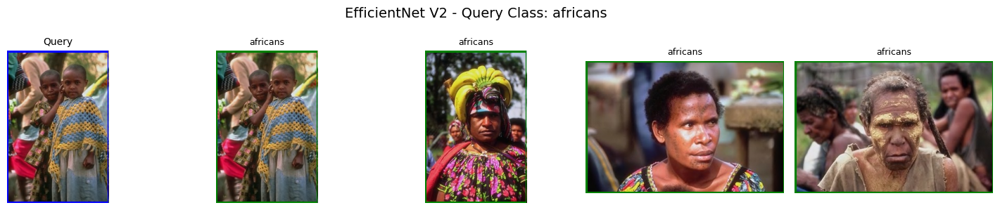

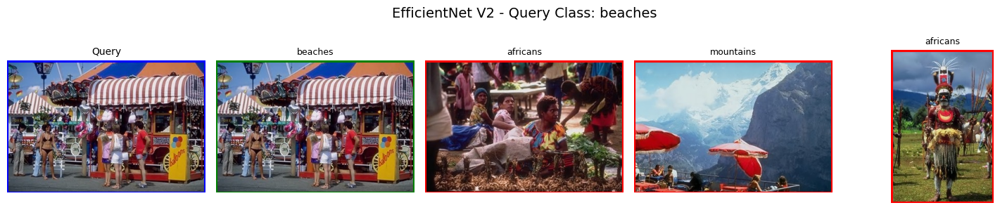

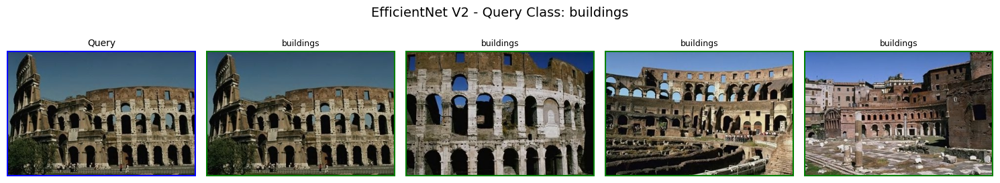

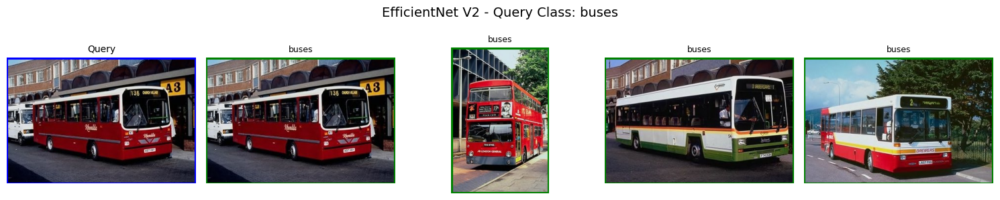

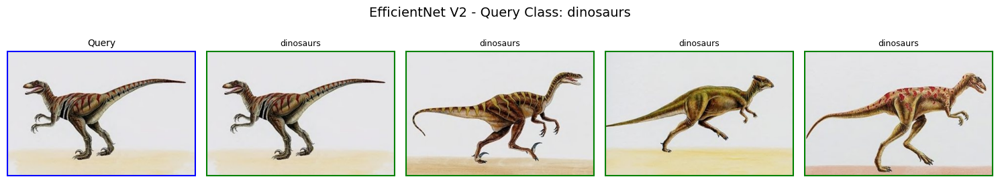

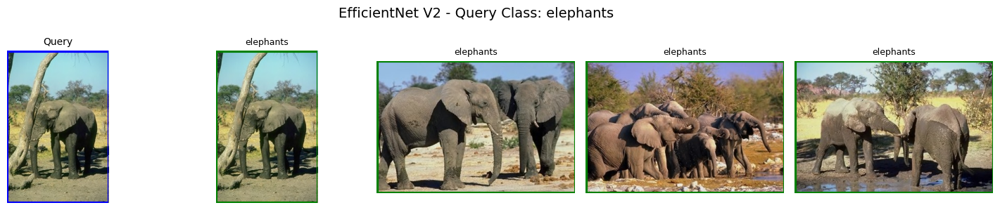

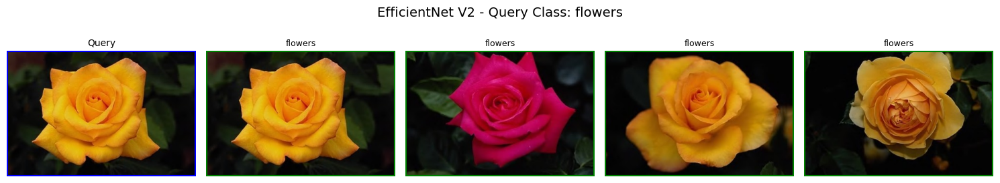

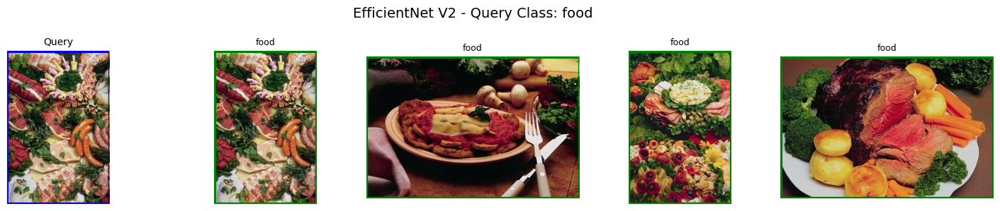

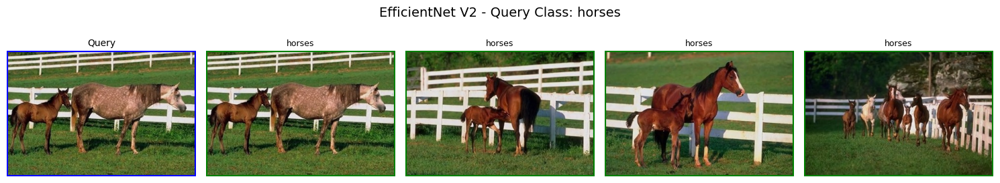

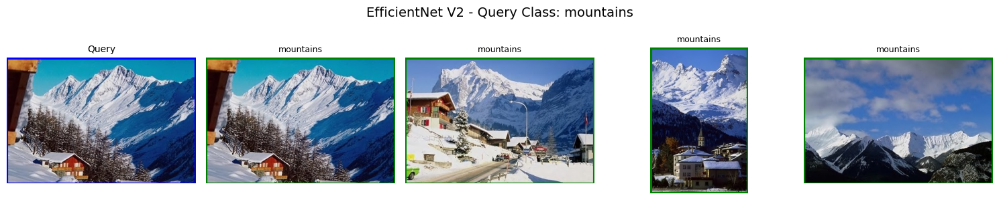

In [26]:
show_topk_cbir(efficientnet_features, labels, img_paths, top_k=4, model_name="EfficientNet V2")


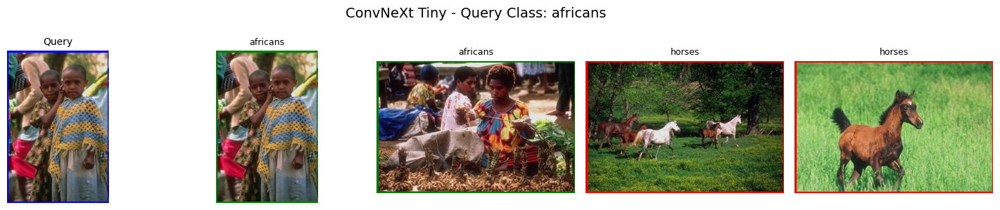

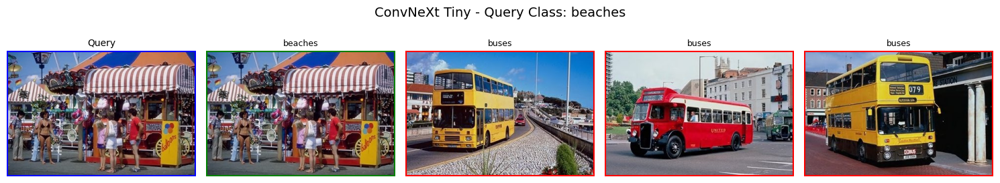

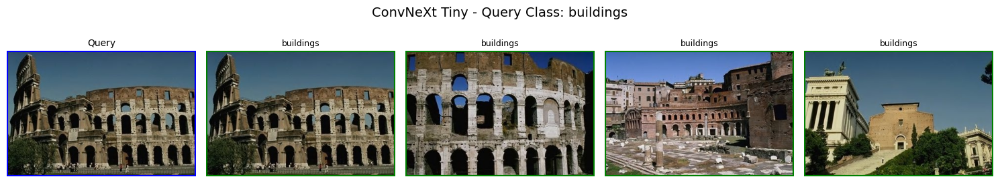

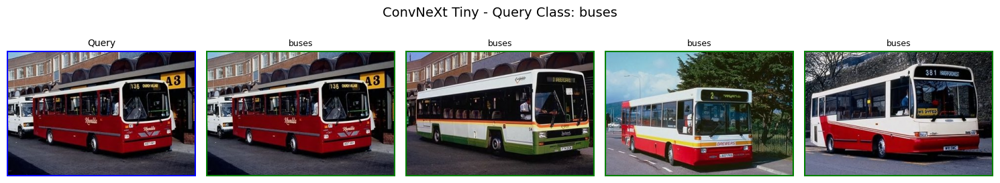

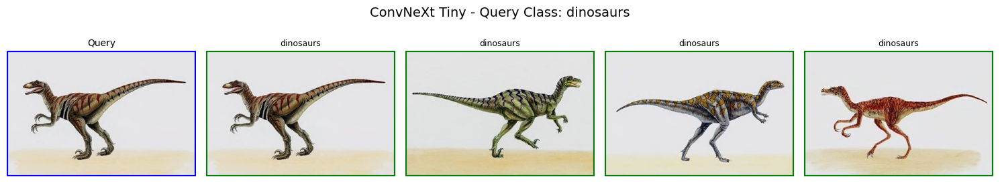

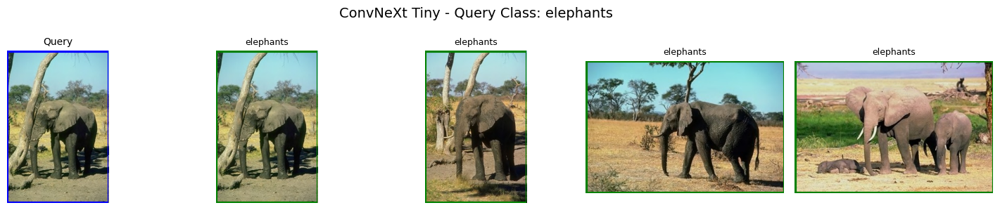

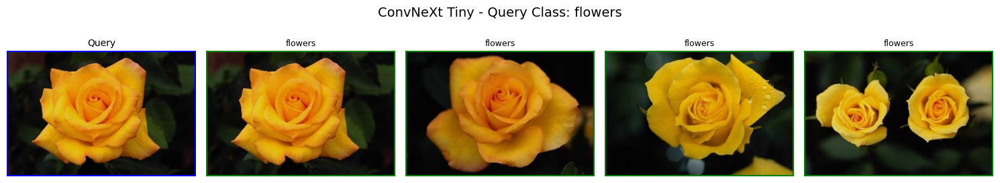

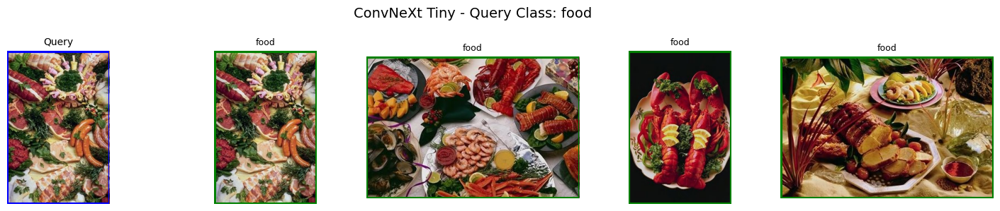

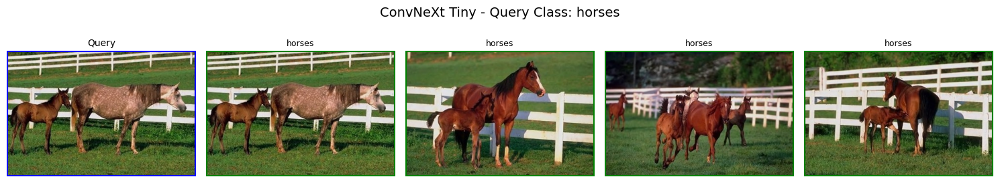

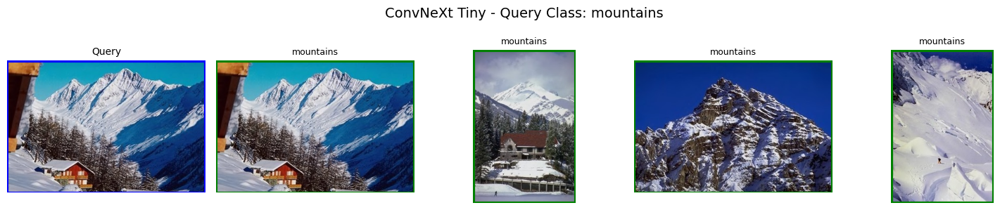

In [27]:
show_topk_cbir(convnext_features, labels, img_paths, top_k=4, model_name="ConvNeXt Tiny")

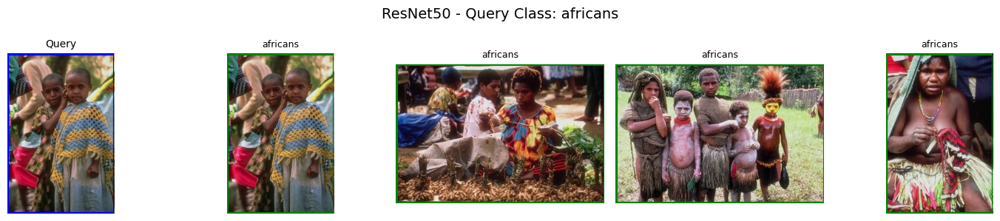

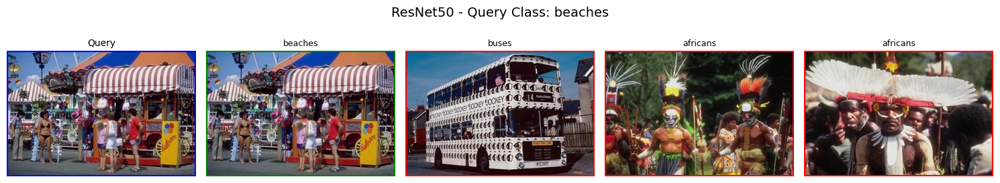

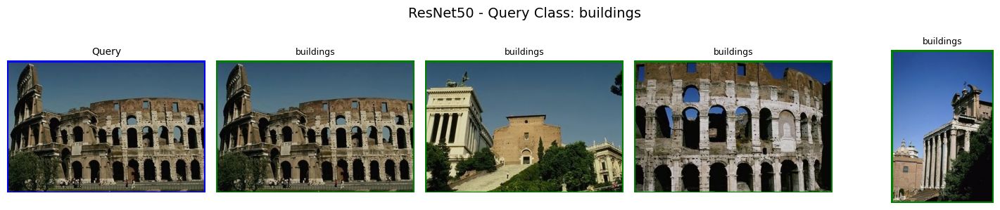

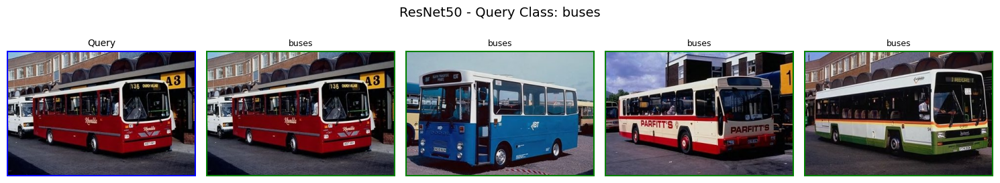

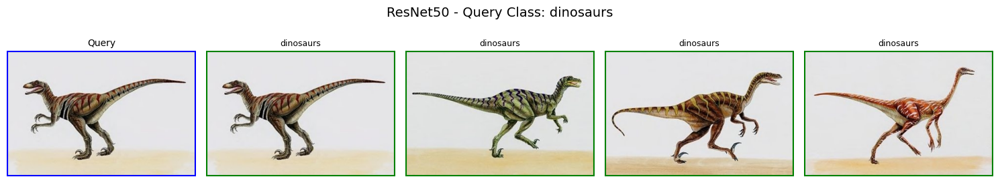

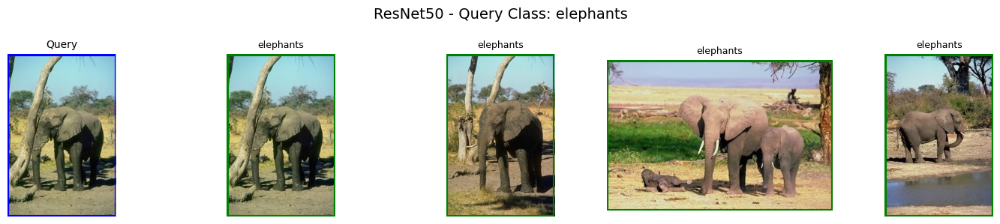

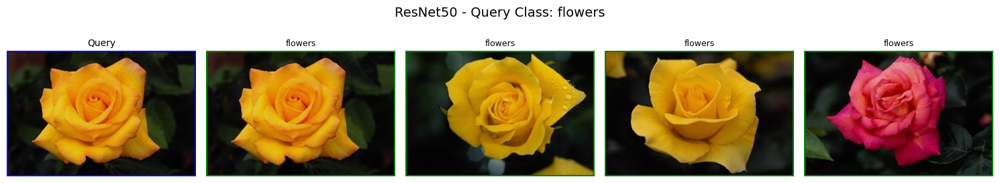

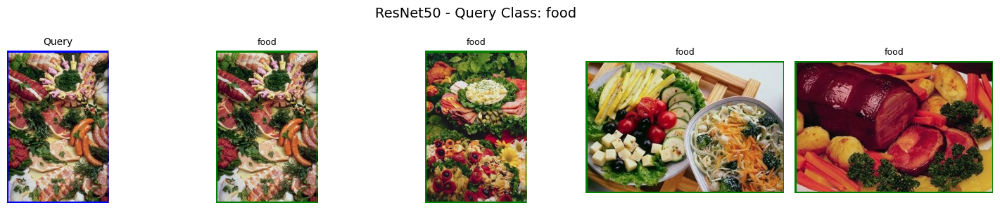

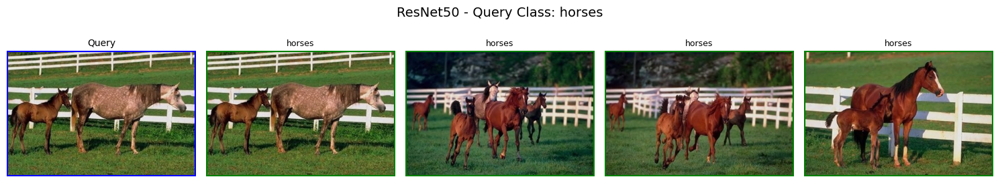

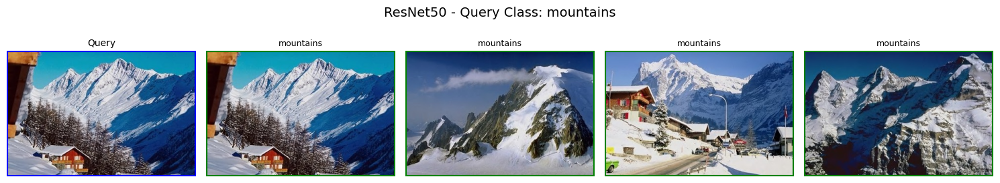

In [28]:
show_topk_cbir(resnet50_features, labels, img_paths, top_k=4, model_name="ResNet50")